In [1]:
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from scipy.io import loadmat

# nasty import hack - this is a code smell, work out how to remove it
import sys
sys.path.append('../')
from simcoder.models import get_model

/usr/local/lib/python3.8/dist-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
IMAGE_FILES_PER_FOLDER = 10000
mf_dir = Path('/input/')

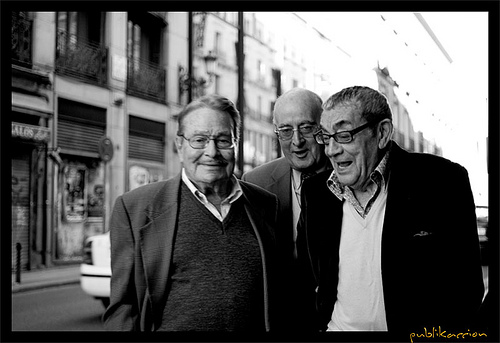

In [3]:
def get_mf_image(index: int) -> Image.Image:
    folder_idx = index // IMAGE_FILES_PER_FOLDER
    path = mf_dir / str(folder_idx) / f"{index}.jpg"
    img = Image.open(path)  # TODO: work out how to close this file pointer
    return img

query_image = get_mf_image(140014)
query_image

In [4]:
def encode(query_image: Image.Image, model_name: str) -> np.array:
    model, preprocess = get_model(model_name)
    img = preprocess(query_image)
    features = model(img.unsqueeze(0))
    features = features.squeeze().detach().cpu().numpy()
    return features

features = encode(query_image, "resnet50_softmax")

Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


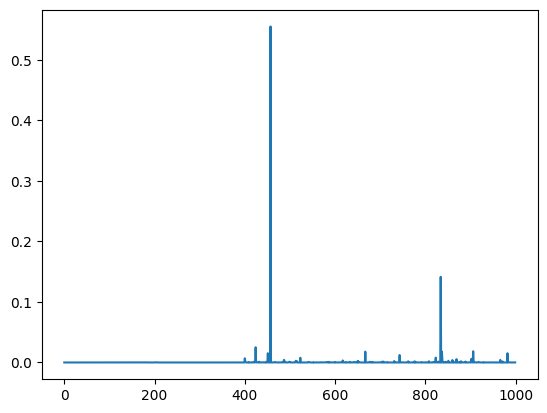

In [5]:
def show_features(features: np.array):
    plt.plot(features)
    plt.show()

show_features(features)

In [6]:
def load_mf_encodings(encodings_dir: Path) -> np.array:
    paths = encodings_dir.glob("*.mat")
    encodings = [loadmat(p)['features'] for p in paths]
    encodings = np.concatenate(encodings)
    return encodings

mf_encodings = load_mf_encodings(Path('/output', 'mf_resnet50_softmax'))

In [7]:
def euclid(img_features: np.array, encodings: np.array):
    distances = np.sqrt(np.sum((img_features - encodings)**2, axis=1))
    return distances

distances = euclid(features, mf_encodings)

In [8]:
def nearest(count: int):
    sorted_indices = np.argsort(distances)
    return sorted_indices[:count]

top_100_nearest = nearest(100)

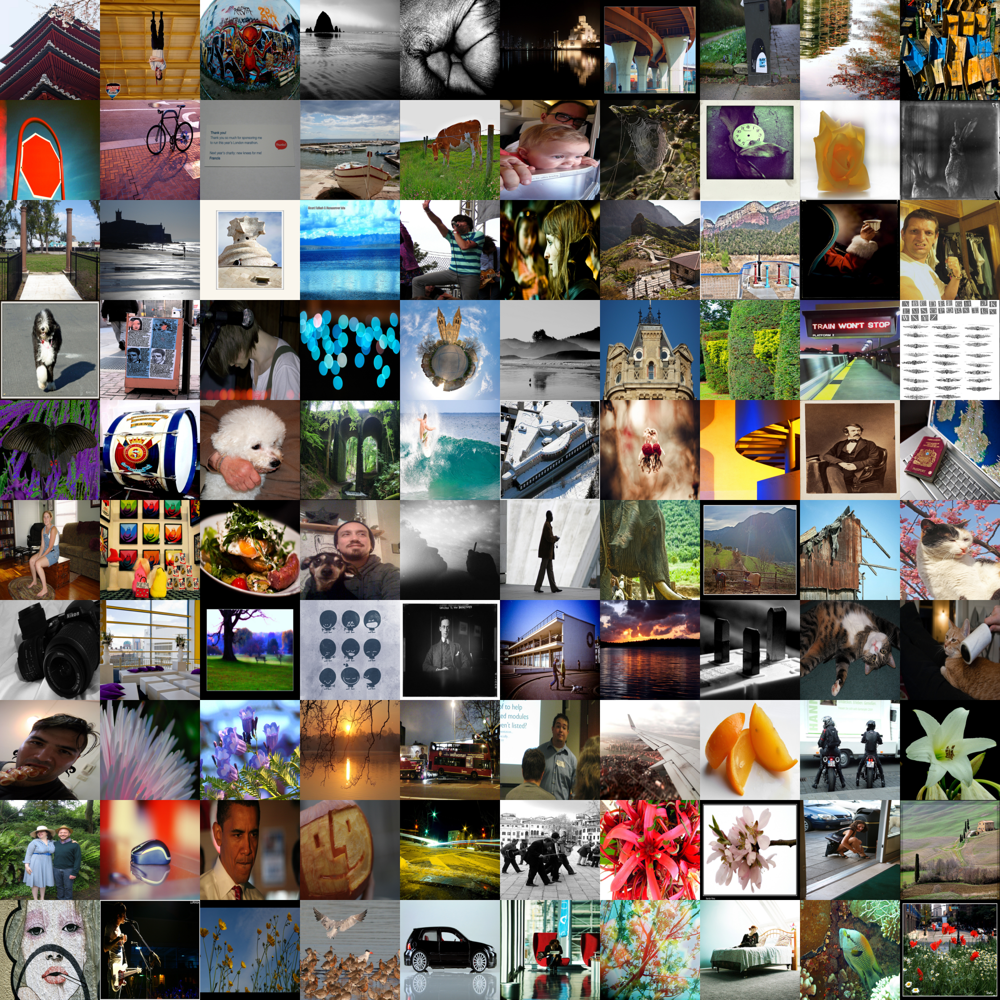

In [9]:
def show_mf_image_grid(img_indices: np.array, num_cols: int, num_rows: int, img_w: int, img_h: int):
    images = [get_mf_image(i) for i in img_indices]
    grid = Image.new('RGB', size=(num_cols*img_w, num_rows*img_h))
    for idx, img in enumerate(images):
        img = img.resize((224, 224), Image.Resampling.BILINEAR)
        grid.paste(img, box=(idx%num_cols*img_w, idx//num_cols*img_h))
    return grid


show_mf_image_grid(top_100_nearest, 10, 10, 224, 224)        